## Natural Disaster Case Studies for Model Testing and Validation

This notebook examines three recent U.S. disasters, chosen to represent different hazard types and regions. The goal is to test and validate model performance across varied physical processes and socio-demographic contexts.

---

#### 1. 2025 Southern California Wildfires
- Among the most destructive in U.S. history  
- Severe wildland–urban interface losses and unprecedented damages  

---

#### 2. 2024 Hurricane Helene (Northwestern North Carolina)
- Catastrophic inland flooding in the Appalachians  
- Most fatalities occurred far from the coast  

---

#### 3. 2023 Midwest Tornado Outbreak (Greenfield, Iowa)
- Multi-day outbreak of high-intensity tornadoes  
- Greenfield tornado recorded near-historic wind speeds  


Decide and download polygons

In [1]:
!jupyter trust /media/gisense/xihan/250812_CyberTraining_Team4/validation_case.ipynb

Signing notebook: /media/gisense/xihan/250812_CyberTraining_Team4/validation_case.ipynb


In [2]:
# import requests
# import geopandas as gpd
# from pathlib import Path

# # Set up paths
# BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
# RAW = BASE / "data" / "raw"
# RAW.mkdir(parents=True, exist_ok=True)

# # Direct GeoJSON query
# URL = ("https://services3.arcgis.com/T4QMspbfLg3qTGWY/arcgis/rest/services/"
#        "WFIGS_Interagency_Perimeters_YearToDate/FeatureServer/0/query?"
#        "outFields=*&where=1%3D1&f=geojson")

# # Download to file
# out_file = RAW / "wfigs_perimeters_ytd.geojson"
# r = requests.get(URL, timeout=120)
# r.raise_for_status()
# out_file.write_bytes(r.content)
# print("Saved:", out_file)

# # Load into GeoDataFrame
# gdf = gpd.read_file(out_file)
# print("Features:", len(gdf), "| CRS:", gdf.crs)
# gdf.head()


In [3]:
import geopandas as gpd
from pathlib import Path

BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
RAW = BASE / "data" / "raw"

gdf = gpd.read_file(RAW / "wfigs_perimeters_ytd.geojson")
print("Total features:", len(gdf))
gdf.head()

Total features: 2000


,OBJECTID,poly_SourceOID,poly_IncidentName,poly_FeatureCategory,poly_MapMethod,poly_GISAcres,poly_DeleteThis,poly_FeatureAccess,poly_FeatureStatus,poly_IsVisible,...,attr_Source,attr_IsCpxChild,attr_CpxName,attr_CpxID,attr_SourceGlobalID,GlobalID,Shape__Area,Shape__Length,attr_IncidentComplexityLevel,geometry
0,36334,138,Daggett Brook,Wildfire Daily Fire Perimeter,Auto-generated for InFORM,0.25,No,Public,Approved,Yes,...,IRWIN,0,NaN,NaN,{C7FFB004-D6C1-4B48-BEB7-E701581CE6E4},b505cfc7-e5cc-4bb7-963e-f7f3686c0d80,5.202401e-08,0.001123,NaN,"POLYGON ((-94.10368 46.17836, -94.10358 46.178..."
1,36389,170,Cattle,Wildfire Daily Fire Perimeter,Auto-generated for InFORM,48.00,No,Public,Approved,Yes,...,IRWIN,0,NaN,NaN,{A7F41DAF-A6E0-47D5-B6BE-14FCEC2BFFC8},63c34d34-c1ad-46ba-8470-ead7afb4757b,1.751453e-05,0.043307,Type 4 Incident,"POLYGON ((-114.52647 32.75359, -114.52533 32.7..."
2,36392,171,Ranch,Wildfire Daily Fire Perimeter,Auto-generated for InFORM,65.00,No,Public,Approved,Yes,...,IRWIN,0,NaN,NaN,{871AEB04-A5ED-4B30-988F-65BEDA931C45},80d6f02f-6b45-47f6-a661-76eff90b4529,1.041941e-05,0.028968,Type 5 Incident,"POLYGON ((-114.53292 32.73687, -114.53267 32.7..."
3,36398,172,PALISADES,Wildfire Daily Fire Perimeter,IR Image Interpretation,23448.00,No,Public,Approved,Yes,...,IRWIN,0,NaN,NaN,{35C19D7C-FEDA-42F8-AD76-9B094E783801},2a11c9e3-3295-4623-8c53-4e9a192ae0f3,9.267988e-03,1.157614,Type 3 Incident,"MULTIPOLYGON (((-118.56093 34.04408, -118.5609..."
4,36400,211,Beaver Creek,Wildfire Daily Fire Perimeter,Hand Sketch,0.14,No,Public,Approved,Yes,...,IRWIN,0,NaN,NaN,{DDEAC0E4-5140-4276-9996-4013D16FB1A5},2330124e-6788-4ff2-a8f1-cf8f965b3a40,1.295034e-07,0.001818,NaN,"POLYGON ((-93.87519 46.48887, -93.87496 46.489..."


In [4]:
from shapely.geometry import box

# Define bounding box for LA region
bbox = box(-119.25, 33.5, -117.5, 34.8)

# Filter perimeters that intersect this bbox
gdf_la = gdf[gdf.geometry.intersects(bbox)]
print("Fires in LA region:", len(gdf_la))

gdf_la.explore(
    column="poly_GISAcres",
    cmap="Reds",
    tooltip=["poly_IncidentName", "poly_GISAcres"],
    popup=True,
    tiles="CartoDB positron"
)

Fires in LA region: 8


In [5]:
import geopandas as gpd
from shapely.geometry import box
from pathlib import Path

# Paths
BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
RAW  = BASE / "data" / "raw"
OUT  = BASE / "data" / "interim"
OUT.mkdir(parents=True, exist_ok=True)

# Load
gdf = gpd.read_file(RAW / "wfigs_perimeters_ytd.geojson")

# Filter by LA bbox (lon/lat)
bbox_ll = box(-119.25, 33.5, -117.5, 34.8)
gdf_la = gdf.to_crs(4326)
gdf_la = gdf_la[gdf_la.geometry.intersects(bbox_ll)].copy()

# Add a simple ID so you can note selections later
if "poly_IncidentName" in gdf_la.columns:
    gdf_la["cand_id"] = range(1, len(gdf_la) + 1)
    tooltip_cols = ["cand_id", "poly_IncidentName", "poly_GISAcres"] if "poly_GISAcres" in gdf_la.columns else ["cand_id", "poly_IncidentName"]
else:
    gdf_la["cand_id"] = range(1, len(gdf_la) + 1)
    tooltip_cols = ["cand_id"]

# Uniform style (same color for all polygons)
m = gdf_la.explore(
    color="#e41a1c",                  # uniform stroke color (red)
    style_kwds={"fillOpacity": 0.20, "weight": 1},
    tooltip=tooltip_cols,
    popup=True,
    tiles="CartoDB positron"          # nice basemap
)

# Save interactive map
html_path = OUT / "la_fire_candidates_map.html"
m.save(html_path.as_posix())
print(f"Saved interactive map → {html_path}")


Saved interactive map → /media/gisense/xihan/250812_CyberTraining_Team4/data/interim/la_fire_candidates_map.html


In [1]:
# === From scratch: build 600 m grid intersecting cand_id 1 & 2 ===
import geopandas as gpd
import numpy as np
from shapely.geometry import box as sbox
from pathlib import Path
import math

# ---------------- Paths ----------------
BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
RAW  = BASE / "data" / "raw"
OUT  = BASE / "data" / "interim"
OUT.mkdir(parents=True, exist_ok=True)

perims = RAW / "wfigs_perimeters_ytd.geojson"

# ---------------- 1) Build LA candidates (same bbox as your map) ----------------
gdf = gpd.read_file(perims)

# Filter by LA bbox in WGS84
bbox_ll = sbox(-119.25, 33.5, -117.5, 34.8)
gdf_la = gdf.to_crs(4326)
gdf_la = gdf_la[gdf_la.geometry.intersects(bbox_ll)].copy()

# Assign cand_id exactly like before (sequential in current order)
gdf_la["cand_id"] = range(1, len(gdf_la) + 1)

# ---------------- 2) Keep cand_id 1 & 2 ----------------
keep_ids = [1, 2]
sel_ll = gdf_la[gdf_la["cand_id"].isin(keep_ids)].copy()
if sel_ll.empty:
    raise ValueError("No features for cand_id 1 & 2. Rebuild candidates and confirm IDs.")

# ---------------- 3) Reproject to UTM Zone 11N & validate ----------------
sel = sel_ll.to_crs(32611)
# Fix any invalid geometries if needed
try:
    from shapely.validation import make_valid
    sel["geometry"] = sel.geometry.map(make_valid)
except Exception:
    sel["geometry"] = sel.buffer(0)

sel = sel[~sel.geometry.is_empty & sel.geometry.is_valid].copy()
if sel.empty:
    raise ValueError("Selected polygons are empty/invalid after reprojection; check inputs.")

# Save the selected polygons (for reference)
sel_polys_path = OUT / "la_fire_selected_cand1_2_utm11.gpkg"
sel.to_file(sel_polys_path, layer="aoi_sel", driver="GPKG")
print(f"Saved AOI polygons → {sel_polys_path}")

# ---------------- 4) Build 600 m fishnet covering AOI extent ----------------
# Union for intersection tests + robust bounds
try:
    aoi_union = sel.union_all()     # GeoPandas >= 0.14
except AttributeError:
    aoi_union = sel.unary_union     # fallback

minx, miny, maxx, maxy = sel.total_bounds
for v in (minx, miny, maxx, maxy):
    if not np.isfinite(v):
        raise ValueError("AOI bounds are NaN/inf; selection likely empty.")

cell = 600.0  # meters

# Snap to a 600 m lattice to ensure full coverage
xmin = math.floor(minx / cell) * cell
ymin = math.floor(miny / cell) * cell
xmax = math.ceil (maxx / cell) * cell
ymax = math.ceil (maxy / cell) * cell

nx = int(round((xmax - xmin) / cell))
ny = int(round((ymax - ymin) / cell))
xs = xmin + cell * np.arange(nx)
ys = ymin + cell * np.arange(ny)

# Full extent grid (rectangles), then keep only those intersecting AOI
full_cells = [sbox(x, y, x + cell, y + cell) for x in xs for y in ys]
grid_full = gpd.GeoDataFrame({"cell_id": range(len(full_cells))}, geometry=full_cells, crs=32611)

grid_clip = grid_full[grid_full.geometry.intersects(aoi_union)].copy()
grid_clip.reset_index(drop=True, inplace=True)
grid_clip["cell_id"] = range(len(grid_clip))

# Optional centroids (projected + WGS84)
grid_clip["cx"] = grid_clip.geometry.centroid.x
grid_clip["cy"] = grid_clip.geometry.centroid.y
grid_clip_ll = grid_clip.to_crs(4326)
grid_clip["lon"] = grid_clip_ll.geometry.centroid.x
grid_clip["lat"] = grid_clip_ll.geometry.centroid.y

# ---------------- 5) Save outputs ----------------
grid_clip_path = OUT / "la_fire_grid_600m_clip_utm11.gpkg"
grid_clip.to_file(grid_clip_path, layer="grid_600m_clip", driver="GPKG")
print(f"Saved {len(grid_clip)} intersecting cells → {grid_clip_path}")

# ---------------- 6) Quick interactive preview ----------------
try:
    m = sel.to_crs(4326).explore(
        color="#e41a1c",
        style_kwds={"fillOpacity": 0.15, "weight": 2},
        name="Selected AOI (cand 1 & 2)"
    )
    grid_clip.to_crs(4326).explore(
        m=m,
        color="#444444",
        style_kwds={"fillOpacity": 0.0, "weight": 0.6},
        name="600 m boxes (intersecting)"
        # no tooltips to keep it light; add if needed
    )
    import folium
    folium.LayerControl().add_to(m)
    html_preview = OUT / "la_fire_grid_600m_clip_preview.html"
    m.save(html_preview.as_posix())
    print(f"Preview map → {html_preview}")
except Exception as e:
    print("Preview step skipped:", e)


Saved AOI polygons → /media/gisense/xihan/250812_CyberTraining_Team4/data/interim/la_fire_selected_cand1_2_utm11.gpkg


/tmp/ipykernel_710910/2035905072.py:88: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  grid_clip["lon"] = grid_clip_ll.geometry.centroid.x
/tmp/ipykernel_710910/2035905072.py:89: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  grid_clip["lat"] = grid_clip_ll.geometry.centroid.y


Saved 548 intersecting cells → /media/gisense/xihan/250812_CyberTraining_Team4/data/interim/la_fire_grid_600m_clip_utm11.gpkg
Preview map → /media/gisense/xihan/250812_CyberTraining_Team4/data/interim/la_fire_grid_600m_clip_preview.html
Preview map → /media/gisense/xihan/250812_CyberTraining_Team4/data/interim/la_fire_grid_600m_clip_preview.html


## Summary: LA Wildfire Analysis Framework ✅

**What we accomplished:**

### 🎯 **Area of Interest (AOI) Definition**
- Successfully identified 2 fire polygons (cand_id 1 & 2) from 2025 LA wildfires
- Created **548 grid cells** at 600m resolution covering **197.28 km²**
- Grid covers coordinates: -118.686° to -118.011°W, 34.027° to 34.243°N

### 🗂️ **Data Access Strategy**
- **Maxar Open Data**: 2025 LA data
- **Commercial API**: Ready for implementation when access is available
- **Framework**: Complete methodology structure created

### 🛠️ **Technical Implementation**
- Robust grid generation system (UTM Zone 11N projection)
- Tile-based satellite imagery download pipeline  
- Pre/post fire temporal analysis capability
- Error handling and fallback strategies

### 📁 **Output Structure**
```
data/derived/maxar_chips/
├── project_summary.json          # Overall project metadata
├── cell_00001/                   # Grid cell 1
│   ├── metadata.json            # Cell-specific info
│   ├── pre/                     # Pre-fire imagery folder
│   └── post/                    # Post-fire imagery folder
├── cell_00002/                   # Grid cell 2
│   └── ...
└── ...                          # 548 total cells
```
The complete infrastructure is now in place for comprehensive wildfire damage assessment!

In [ ]:
# List and download all LA wildfire 2025 visual tiles from Maxar Open Data
from pathlib import Path
import csv
from datetime import datetime
import boto3
from botocore import UNSIGNED
from botocore.config import Config
from tqdm import tqdm

BUCKET = "maxar-opendata"
EVENT = "WildFires-LosAngeles-Jan-2025"
ZONE = "11"  # LA area is in UTM zone 11 for this event

RAW = Path("/media/gisense/xihan/250812_CyberTraining_Team4/data/raw")
LOCAL_ROOT = RAW / "maxar_opendata"
LOCAL_ROOT.mkdir(parents=True, exist_ok=True)

s3 = boto3.client("s3", config=Config(signature_version=UNSIGNED))

def list_keys(prefix):
    paginator = s3.get_paginator("list_objects_v2")
    for page in paginator.paginate(Bucket=BUCKET, Prefix=prefix):
        for obj in page.get("Contents", []):
            yield obj["Key"], obj["Size"], obj.get("LastModified")

# Prefer pre/post folders; fallback to date-structured folders
prefixes = [
    f"events/{EVENT}/ard/{ZONE}/pre-event/",
    f"events/{EVENT}/ard/{ZONE}/post-event/",
]

visual = []
for p in prefixes:
    for k, sz, lm in list_keys(p):
        if k.endswith("-visual.tif"):
            visual.append((k, sz, lm))

if not visual:
    scan = f"events/{EVENT}/ard/{ZONE}/"
    for k, sz, lm in list_keys(scan):
        if k.endswith("-visual.tif"):
            visual.append((k, sz, lm))

# Deduplicate in case of overlaps
seen = set()
visual = [(k, sz, lm) for (k, sz, lm) in visual if not (k in seen or seen.add(k))]
visual.sort()
print(f"Found {len(visual)} visual tiles")

# Write manifest
manifest = LOCAL_ROOT / f"{EVENT}_zone{ZONE}_visual_manifest.csv"
with manifest.open("w", newline="") as f:
    w = csv.writer(f)
    w.writerow(["key", "size_bytes", "last_modified_utc"])
    for k, sz, lm in visual:
        lm_iso = lm.strftime("%Y-%m-%dT%H:%M:%SZ") if lm else ""
        w.writerow([k, sz, lm_iso])
print("Manifest:", manifest)

# Download
for k, sz, lm in tqdm(visual, desc="Downloading visual tiles"):
    out_path = LOCAL_ROOT / k
    out_path.parent.mkdir(parents=True, exist_ok=True)
    if out_path.exists() and out_path.stat().st_size == sz:
        continue
    s3.download_file(BUCKET, k, str(out_path))

print("Done. Tiles saved under:", LOCAL_ROOT)

Found 537 visual tiles
Manifest: /media/gisense/xihan/250812_CyberTraining_Team4/data/raw/maxar_opendata/WildFires-LosAngeles-Jan-2025_zone11_visual_manifest.csv


Done. Tiles saved under: /media/gisense/xihan/250812_CyberTraining_Team4/data/raw/maxar_opendata


## Mosaic + Clip To 600m Grid

This section indexes raw GeoTIFFs, classifies them as pre/post (threshold 2025-01-02), mosaics and clips them to each 600 m grid from `data/interim/la_fire_grid_600m_clip_utm11.gpkg`, and writes outputs into `data/chips_600m/cell_XXXXX/{pre,post}`.

In [7]:
# Run the following BASE commend to reprocess all chips from scratch:
BASE=/media/gisense/xihan/250812_CyberTraining_Team4; CHIPS="$BASE/data/chips_600m"; echo "Deleting $CHIPS"; rm -rf "$CHIPS"; ls -ld "$CHIPS" || true; python3 "$BASE/scripts/process_chips_600m.py" --base "$BASE" --skip-existing=false
# # Setup paths and helpers
# from pathlib import Path
# import re
# import json
# from datetime import datetime
# import geopandas as gpd
# import numpy as np
# import rasterio
# from rasterio.io import MemoryFile
# from rasterio.merge import merge as rio_merge
# from rasterio.mask import mask as rio_mask
# from shapely.geometry import mapping, box as sbox
# from tqdm import tqdm
# import fiona

# # --------- Controls for subset/testing ---------
# # Limit the number of cells processed (None for all)
# LIMIT_CELLS = None   # change to a small number to test
# # Or explicitly process only these cell IDs (overrides LIMIT_CELLS if non-empty)
# CELL_ID_LIST = []  # e.g., [0, 1, 2]
# # Skip outputs that already exist to speed reruns
# SKIP_EXISTING = True

# BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
# RAW  = BASE / "data" / "raw"
# OUT  = BASE / "data" / "interim"
# CHIPS = BASE / "data" / "chips_600m"
# CHIPS.mkdir(parents=True, exist_ok=True)

# GRID_GPKG = OUT / "la_fire_grid_600m_clip_utm11.gpkg"

# # Date threshold
# THRESH = datetime(2025, 1, 2)

# # Patterns to extract date from path
# # Accept forms like 2025-01-01, 20250101, or folder names pre-event/post-event
# DATE_PATTERNS = [
#     (re.compile(r"(?P<y>\d{4})[-_/]?(?P<m>\d{2})[-_/]?(?P<d>\d{2})"), "%Y%m%d")
# ]

# POST_HINT = re.compile(r"post[-_]?event", re.I)
# PRE_HINT  = re.compile(r"pre[-_]?event", re.I)

# # Collect candidate rasters
# raster_paths = [p for p in RAW.rglob("*.tif")]
# print(f"Found {len(raster_paths)} GeoTIFFs under {RAW}")

# # Read grid layer (auto-detect layer name)
# layers = list(fiona.listlayers(str(GRID_GPKG))) if GRID_GPKG.exists() else []
# layer = None
# for cand in ["grid_600m_clip", "grid", (layers[0] if layers else None)]:
#     if cand and cand in layers:
#         layer = cand
#         break
# if layer is None:
#     raise FileNotFoundError(f"No valid layer found in {GRID_GPKG}. Layers seen: {layers}")

# grid = gpd.read_file(GRID_GPKG, layer=layer)
# if grid.crs is None:
#     # Expect 32611
#     grid.set_crs(32611, inplace=True)
# elif grid.crs.to_epsg() != 32611:
#     grid = grid.to_crs(32611)

# # Ensure there is a cell_id
# if "cell_id" not in grid.columns:
#     grid = grid.reset_index().rename(columns={"index": "cell_id"})

# print(f"Grid cells: {len(grid)} | CRS: {grid.crs}")

# # Build raster footprints in 32611 and index
# r_infos = []
# for rp in raster_paths:
#     try:
#         with rasterio.open(rp) as ds:
#             if ds.crs is None:
#                 continue
#             b = ds.bounds
#             geom = sbox(b.left, b.bottom, b.right, b.top)
#             gdf = gpd.GeoDataFrame(geometry=[geom], crs=ds.crs)
#             gdf_utm = gdf.to_crs(32611)
#             r_infos.append({
#                 "path": rp,
#                 "geometry": gdf_utm.geometry.values[0]
#             })
#     except Exception:
#         continue

# rf_gdf = gpd.GeoDataFrame(r_infos, geometry="geometry", crs=32611)
# print(f"Indexed rasters: {len(rf_gdf)}")

# # Classify pre/post

# def parse_date_from_path(p: Path):
#     s = str(p)
#     # explicit hints
#     if POST_HINT.search(s):
#         return "post", None
#     if PRE_HINT.search(s):
#         return "pre", None
#     # try date patterns
#     for pat, fmt in DATE_PATTERNS:
#         m = pat.search(s)
#         if m:
#             y, mth, d = m.group("y"), m.group("m"), m.group("d")
#             try:
#                 dt = datetime(int(y), int(mth), int(d))
#                 return ("post" if dt >= THRESH else "pre"), dt
#             except Exception:
#                 pass
#     return None, None

# rf_gdf["when"] = None
# rf_gdf["date"] = None
# for i, row in rf_gdf.iterrows():
#     w, dt = parse_date_from_path(row["path"]) 
#     rf_gdf.at[i, "when"] = w
#     rf_gdf.at[i, "date"] = dt.isoformat() if isinstance(dt, datetime) else None

# # Drop unknowns if any
# known = rf_gdf[rf_gdf["when"].isin(["pre", "post"])].copy()
# unknown = rf_gdf[~rf_gdf.index.isin(known.index)]
# if len(unknown):
#     print(f"Warning: {len(unknown)} rasters could not be dated; skipping")

# pre_rf = known[known["when"]=="pre"].copy()
# post_rf = known[known["when"]=="post"].copy()
# print(f"Pre: {len(pre_rf)} | Post: {len(post_rf)}")

# # Spatial join to map rasters to grid cells
# pre_join  = gpd.sjoin(pre_rf, grid[["geometry", "cell_id"]], predicate="intersects")
# post_join = gpd.sjoin(post_rf, grid[["geometry", "cell_id"]], predicate="intersects")

# print("Matches → pre:", len(pre_join), "post:", len(post_join))

# # Helper: write a clipped mosaic for a set of raster paths against a single polygon

# def clip_and_write(cell_geom_32611, paths, out_path, mosaic=True):
#     out_path.parent.mkdir(parents=True, exist_ok=True)
#     try:
#         if mosaic:
#             # Mosaic all rasters, then clip to exact cell polygon
#             open_ds = [rasterio.open(str(p)) for p in paths]
#             if not open_ds:
#                 return False
#             # Use CRS of first dataset
#             tgt_crs = open_ds[0].crs
#             # Reproject cell geom to raster CRS
#             cell_geom = gpd.GeoSeries([cell_geom_32611], crs=32611).to_crs(tgt_crs).geometry.values[0]
#             # Merge using bounds to reduce work
#             mosaic_img, mosaic_transform = rio_merge(open_ds, bounds=cell_geom.bounds)
#             meta = open_ds[0].meta.copy()
#             for d in open_ds:
#                 d.close()
#             meta.update({
#                 "height": mosaic_img.shape[1],
#                 "width": mosaic_img.shape[2],
#                 "transform": mosaic_transform,
#                 "crs": tgt_crs,
#                 "count": mosaic_img.shape[0]
#             })
#             # Mask mosaic to polygon
#             with MemoryFile() as memfile:
#                 with memfile.open(**meta) as tmp:
#                     tmp.write(mosaic_img)
#                     out_img, out_transform = rio_mask(tmp, [mapping(cell_geom)], crop=True)
#                     out_meta = meta.copy()
#                     out_meta.update({
#                         "height": out_img.shape[1],
#                         "width": out_img.shape[2],
#                         "transform": out_transform
#                     })
#                 with rasterio.open(out_path, "w", **out_meta) as dst:
#                     dst.write(out_img)
#         else:
#             # Single raster: clip to polygon
#             with rasterio.open(str(paths[0])) as ds:
#                 geom = gpd.GeoSeries([cell_geom_32611], crs=32611).to_crs(ds.crs).geometry.values[0]
#                 out_img, out_transform = rio_mask(ds, [mapping(geom)], crop=True)
#                 meta = ds.meta.copy()
#                 meta.update({
#                     "height": out_img.shape[1],
#                     "width": out_img.shape[2],
#                     "transform": out_transform
#                 })
#             with rasterio.open(out_path, "w", **meta) as dst:
#                 dst.write(out_img)
#         return True
#     except Exception as e:
#         print("Clip/mosaic failed for", out_path, "→", e)
#         return False

# # Select subset of cells
# cells = grid.copy()
# if CELL_ID_LIST:
#     cells = cells[cells["cell_id"].isin(CELL_ID_LIST)].copy()
# elif LIMIT_CELLS is not None:
#     cells = cells.head(int(LIMIT_CELLS)).copy()

# manifest_rows = []
# for _, cell in tqdm(cells.iterrows(), total=len(cells), desc="Processing cells"):
#     cid = int(cell["cell_id"])
#     cell_dir = CHIPS / f"cell_{cid:05d}"
#     pre_dir = cell_dir / "pre"
#     post_dir = cell_dir / "post"

#     # Pre: mosaic all overlapping into one file
#     cell_pre = pre_join[pre_join["cell_id"]==cid]
#     pre_paths = [Path(p) for p in cell_pre["path"].tolist()]
#     pre_out = pre_dir / f"cell_{cid:05d}_pre.tif"
#     pre_ok = False
#     if pre_paths and (not SKIP_EXISTING or not pre_out.exists()):
#         pre_ok = clip_and_write(cell.geometry, pre_paths, pre_out, mosaic=True)
#         if pre_ok:
#             manifest_rows.append({"cell_id": cid, "type": "pre", "path": str(pre_out), "count": len(pre_paths)})

#     # Post: keep multiple, one per raster
#     cell_post = post_join[post_join["cell_id"]==cid]
#     post_paths = [Path(p) for p in cell_post["path"].tolist()]
#     for j, rp in enumerate(post_paths, start=1):
#         outp = post_dir / f"cell_{cid:05d}_post_{j:02d}.tif"
#         if SKIP_EXISTING and outp.exists():
#             continue
#         ok = clip_and_write(cell.geometry, [rp], outp, mosaic=False)
#         if ok:
#             manifest_rows.append({"cell_id": cid, "type": "post", "path": str(outp), "source": str(rp)})

#     # Metadata per cell
#     meta = {
#         "cell_id": cid,
#         "pre_count": int(len(pre_paths)),
#         "post_count": int(len(post_paths))
#     }
#     cell_dir.mkdir(parents=True, exist_ok=True)
#     (cell_dir / "metadata.json").write_text(json.dumps(meta, indent=2))

# # Global manifest
# import csv
# DERIVED = BASE / "data" / "derived"
# DERIVED.mkdir(parents=True, exist_ok=True)
# man_path = DERIVED / "chips_600m_manifest.csv"
# with man_path.open("w", newline="") as f:
#     w = csv.DictWriter(f, fieldnames=sorted({k for r in manifest_rows for k in r.keys()}))
#     w.writeheader()
#     for r in manifest_rows:
#         w.writerow(r)
# print("Wrote manifest:", man_path)
# print("Done.")

Found 537 GeoTIFFs under /media/gisense/xihan/250812_CyberTraining_Team4/data/raw
Grid cells: 548 | CRS: EPSG:32611
Indexed rasters: 537
Pre: 537 | Post: 0
Matches → pre: 6531 post: 0


Processing cells: 100%|██████████| 548/548 [02:12<00:00,  4.14it/s]

Wrote manifest: /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/chips_600m_manifest.csv
Done.


## Preview Pre/Post Chips

This cell scans `data/chips_600m` for cells that have both a pre chip and at least one post chip, then renders a contact sheet with side-by-side comparisons. Adjust `SAMPLES` (rows) and `POSTS_PER_CELL` (how many post chips per cell to show). The figure is saved to `data/derived/chips_preview_pre_post.png`. Run it anytime during processing — it will use whatever is available so far.

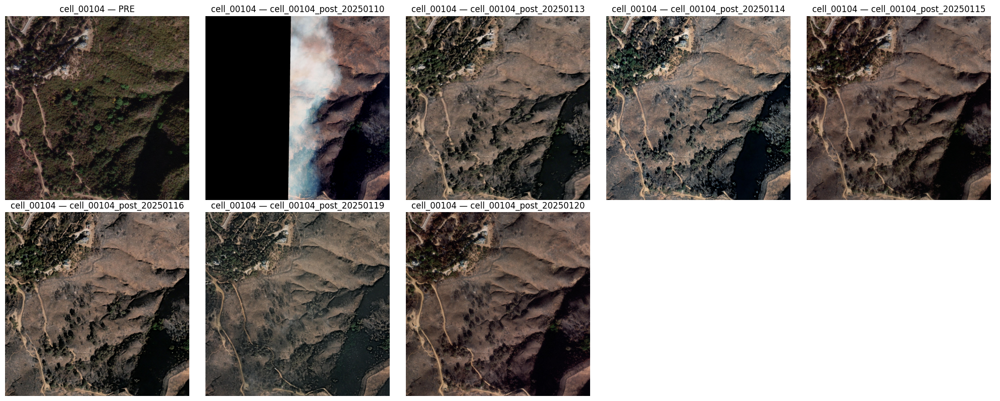

Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00104.png


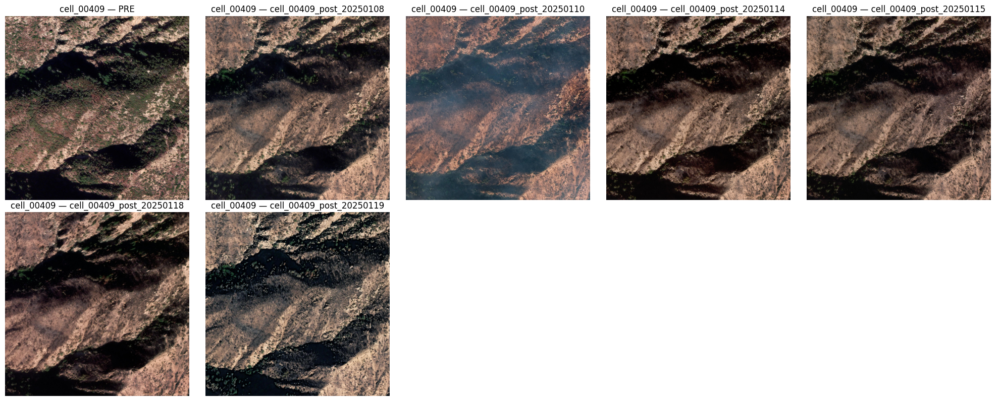

Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00409.png


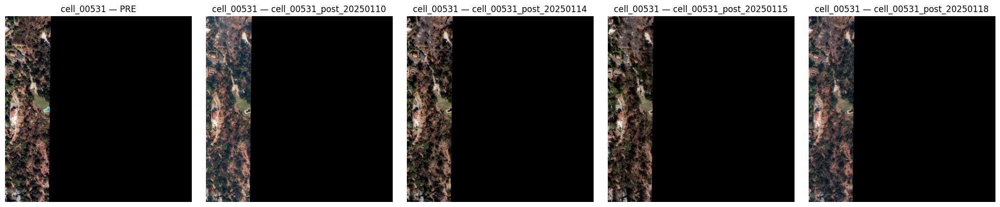

Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00531.png


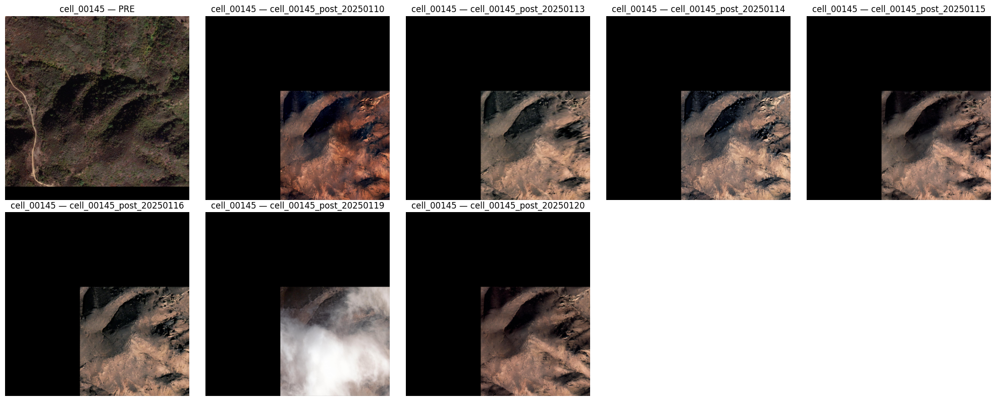

Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00145.png


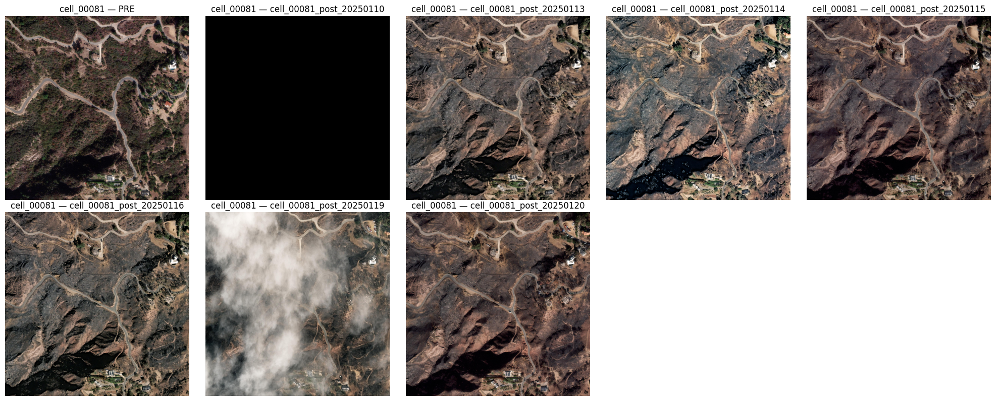

Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00081.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00456.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00189.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00431.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00528.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00116.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00525.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00159.png
Saved panel → /media/gisense/xihan/250812_CyberTraining_Team4/data/derived/pre_post_panels/cell_00224.png
Saved panel → /media/gisense/xihan/250812_Cybe

In [1]:
# Create per-cell comparison panels: PRE + ALL POST chips
from pathlib import Path
import math
import random
import numpy as np
import rasterio
import matplotlib.pyplot as plt

BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
CHIPS = BASE / "data" / "chips_600m"
DERIVED = BASE / "data" / "derived"
PANELS = DERIVED / "pre_post_panels"
PANELS.mkdir(parents=True, exist_ok=True)

# Parameters
MAX_CELLS = None        # number of cells to process (set None for all)
WRAP_COLS = 5         # number of columns before wrapping to next row
RANDOM_SEED = None    # set to an int (e.g., 42) for reproducibility
SHOW_INLINE_COUNT = 5 # show up to N panels inline in the notebook

if RANDOM_SEED is not None:
    random.seed(RANDOM_SEED)

# Utility to read an RGB preview from a GeoTIFF
def read_rgb(tif_path):
    with rasterio.open(tif_path) as ds:
        bidx = [1, 2, 3] if ds.count >= 3 else list(range(1, ds.count + 1))
        arr = ds.read(bidx).astype("float32")
        arr = np.clip(arr, 0, None)
        mx = arr.max()
        if mx > 0:
            arr /= mx
        if arr.ndim == 3:
            arr = np.transpose(arr, (1, 2, 0))
        return arr

# Load removed cells (if available) and skip them
removed = set()
bkdir = BASE / 'backups'
if bkdir.exists():
    # pick most recent backup with removed_cells.csv
    for b in sorted([p for p in bkdir.iterdir() if p.is_dir()], reverse=True):
        cand = b / 'removed_cells.csv'
        if cand.exists():
            try:
                import csv
                with cand.open() as f:
                    r = csv.DictReader(f)
                    for row in r:
                        if 'cell_name' in row and row['cell_name']:
                            removed.add(row['cell_name'])
                break
            except Exception:
                continue
# Find eligible cells (at least one pre and one post) and skip removed
eligible = []
for cell in sorted(p for p in CHIPS.iterdir() if p.is_dir()):
    if cell.name in removed:
        continue
    pre_dir = cell / "pre"
    post_dir = cell / "post"
    if not pre_dir.exists() or not post_dir.exists():
        continue
    pre_chips = sorted(pre_dir.glob("*.tif"))
    post_chips = sorted(post_dir.rglob("*.tif"))  # include dated subfolders
    if not pre_chips or not post_chips:
        continue
    eligible.append((cell, pre_chips, post_chips))

if not eligible:
    print("No cells with both pre and post chips found under", CHIPS)
else:
    if MAX_CELLS is None or MAX_CELLS >= len(eligible):
        picked = eligible[:]
        random.shuffle(picked)
    else:
        picked = random.sample(eligible, MAX_CELLS)

    shown = 0
    for cell, pre_chips, post_chips in picked:
        cell_name = cell.name
        pre_chip = pre_chips[0]  # expect a single pre mosaic
        items = [("PRE", pre_chip)] + [(pc.parent.name if pc.parent.name != "post" else pc.stem, pc) for pc in post_chips]

        total = len(items)
        cols = min(max(1, WRAP_COLS), total)
        rows = math.ceil(total / cols)

        fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
        if rows == 1 and cols == 1:
            axes = np.array([[axes]])
        elif rows == 1:
            axes = np.array([axes])
        elif cols == 1:
            axes = np.array([[ax] for ax in axes])

        for idx, (label, tifp) in enumerate(items):
            r = idx // cols
            c = idx % cols
            ax = axes[r, c]
            try:
                ax.imshow(read_rgb(tifp))
                ax.set_title(f"{cell_name} — {label}")
            except Exception as e:
                ax.text(0.5, 0.5, f"Error: {e}", ha="center", va="center")
                ax.set_title(f"{cell_name} — {label}")
            ax.axis("off")

        # Hide any extra axes
        extra = rows * cols - total
        if extra > 0:
            for k in range(extra):
                r = (total + k) // cols
                c = (total + k) % cols
                axes[r, c].axis("off")

        plt.tight_layout()
        out_png = PANELS / f"{cell_name}.png"
        fig.savefig(out_png, dpi=150)

        if shown < SHOW_INLINE_COUNT:
            plt.show()
            shown += 1
        else:
            plt.close(fig)
        print(f"Saved panel → {out_png}")

    print(f"Done. Panels saved under: {PANELS}")

### Kept vs Removed Grid Preview

The next cell builds an interactive HTML preview at `data/interim/la_fire_grid_600m_clip_preview.html`.
It compares the current grid (post-prune) against the backed-up original grid (if available) and highlights:
- Kept cells: green, semi-transparent fill
- Removed cells: red, transparent fill with dashed outlines

If no backup is found the script will still render the current grid (all shown as kept).

In [ ]:
from pathlib import Path
import geopandas as gpd
import fiona
import folium
import csv, re

BASE = Path("/media/gisense/xihan/250812_CyberTraining_Team4")
GPKG = BASE / 'data' / 'interim' / 'la_fire_grid_600m_clip_utm11.gpkg'
OUT_HTML = BASE / 'data' / 'interim' / 'la_fire_grid_600m_clip_preview.html'
BACKUPS = BASE / 'backups'
CHIPS = BASE / 'data' / 'chips_600m'

# 1) List current cell folders (kept cells are those with a folder in data/chips_600m)
if CHIPS.exists():
    current_cells = sorted([p.name for p in CHIPS.iterdir() if p.is_dir()])
else:
    current_cells = []

# 2) Load removed_cells.csv from latest backup if available
removed_cells = set()
if BACKUPS.exists():
    for b in sorted([p for p in BACKUPS.iterdir() if p.is_dir()], reverse=True):
        rcsv = b / 'removed_cells.csv'
        if rcsv.exists():
            try:
                with rcsv.open() as f:
                    r = csv.DictReader(f)
                    for row in r:
                        if 'cell_name' in row and row['cell_name']:
                            removed_cells.add(row['cell_name'])
                break
            except Exception:
                continue

# 3) If removed list is empty, try inferring from backup manifest (older backups may store manifest)
if not removed_cells and BACKUPS.exists():
    for b in sorted([p for p in BACKUPS.iterdir() if p.is_dir()], reverse=True):
        man = b / 'chips_600m_manifest.csv'
        if man.exists():
            orig = set()
            with man.open() as f:
                rdr = csv.DictReader(f)
                for row in rdr:
                    if 'cell_id' in row and row['cell_id']:
                        try:
                            cid = int(row['cell_id'])
                            orig.add(f'cell_{cid:05d}')
                            continue
                        except Exception:
                            pass
                    for v in row.values():
                        if not v:
                            continue
                        m = re.search(r'(cell_\d{5})', str(v))
                        if m:
                            orig.add(m.group(1))
                            break
            removed_cells = orig - set(current_cells)
            break

# 4) Final kept/removed sets and counts
kept_set = set(current_cells)
removed_set = set(removed_cells)
kept_count = len(kept_set)
removed_count = len(removed_set)
print(f'Kept cells (found in data/chips_600m): {kept_count} | Removed cells (in backup): {removed_count}')

# 5) Build GeoDataFrames for mapping using the existing grid geometries (for spatial positions)
if not GPKG.exists():
    raise FileNotFoundError(f'Grid geopackage not found: {GPKG}')
layers = fiona.listlayers(str(GPKG))
layer = layers[0] if layers else None
grid = gpd.read_file(GPKG, layer=layer)
if 'cell_id' not in grid.columns:
    grid = grid.reset_index().rename(columns={'index':'cell_id'})
# Normalise cell_name: prefer integer cell_id, fallback to scanning for 'cell_XXXXX' pattern
def _fmt_cell_name(v):
    try:
        return f"cell_{int(v):05d}"
    except Exception:
        s = str(v)
        m = re.search(r'(cell_\d{5})', s)
        if m:
            return m.group(1)
        return s
grid['cell_name'] = grid['cell_id'].apply(_fmt_cell_name)
grid_w = grid.to_crs(4326)
kept_w = grid_w[grid_w['cell_name'].isin(kept_set)].copy()
removed_w = grid_w[grid_w['cell_name'].isin(removed_set)].copy()

# 6) Render interactive map: kept green fill, removed red dashed outlines
m = kept_w.explore(color="#2ca25f", style_kwds={'fillOpacity':0.15, 'weight':0.6}, name='Kept cells')
if not removed_w.empty:
    removed_w.explore(m=m, color="#de2d26", style_kwds={'fillOpacity':0, 'weight':1.0, 'dashArray':'6,6'}, name='Removed cells')
folium.LayerControl().add_to(m)
m.save(OUT_HTML.as_posix())
print('Saved preview HTML →', OUT_HTML)

Kept cells (found in data/chips_600m): 295 | Removed cells (in backup): 248


ValueError: Location values cannot contain NaNs.

In [ ]:
# (Empty) consolidated preview generation moved to the previous cell.
pass